## Step1. 훈련 후 best 가중치 저장 폴더 지정 및 trainer 객체화

In [1]:
from super_gradients.training import Trainer

The console stream is logged into C:\Users\AISW-203-104\sg_logs\console.log


[2023-12-06 09:54:55] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2023-12-06 09:54:55] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-12-06 09:54:56,043] torch.distributed.elastic.multiprocessing.redirects: [WARNING] NOTE: Redirects are currently not supported in Windows or MacOs.
[2023-12-06 09:55:05] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-12-06 09:55:05] WARNING - export.py - Failed to import pytorch_quantization
[2023-12-06 09:55:05] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2023-12-06 09:55:05] WARNING - env_sanity_check.py - Failed to verify operating system: Deci officially supports only Linux kernels. Some features may not work as expected.


In [2]:
#project folder 개념
CKPT_DIR = 'Ckpt_fuits_detection_NAS_m'

#sub folder 'ppe_yolonas_run2' 여기세 best weights log files이 저장됨.
trainer = Trainer(experiment_name='Fuits_detection_NAS_m_V01', ckpt_root_dir=CKPT_DIR)

## Step2. roboflow에서 만든 dataset download

In [5]:
#!pip install roboflow

'''
from roboflow import Roboflow
rf = Roboflow(api_key="o0yqFb83ThBmfRlE6Ga8")
project = rf.workspace("taews").project("fruits_detection-veoth")
dataset = project.version(1).download("yolov5")
'''

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Fruits_detection-1 in yolov5pytorch::  98%|█████████▊| 1198/1226 [00:07<00:00, 143.33it/s]

Extracting Dataset Version Zip to Fruits_detection-1 in yolov5pytorch:: 100%|██████████| 1226/1226 [00:08<00:00, 153.22it/s]


## Step3. Load your dataset parameters into a dictionary
You'll need to load your dataset parameters into a dictionary, specifically defining:

- path to the parent directory where your data lives
- the child directory names for training, validation, and test (if you have testing set) images and labels
- class names

In [3]:
import os
HOME = os.getcwd()
print(HOME)

f:\00_Study\00_Project_and_Practice\005_AI_P__YOLO-NAS_Fruit_Detection\YOLO-NAS_Fruits_detection_using_custom_dataset


In [4]:
dataset_params = {
    'data_dir':f'{HOME}/Fruits_detection-1',
    'train_images_dir':f'{HOME}/Fruits_detection-1/train/images',
    'train_labels_dir':f'{HOME}/Fruits_detection-1/train/labels',
    'val_images_dir':f'{HOME}/Fruits_detection-1/valid/images',
    'val_labels_dir':f'{HOME}/Fruits_detection-1/valid/labels',
    'test_images_dir':f'{HOME}/Fruits_detection-1/test/images',
    'test_labels_dir':f'{HOME}/Fruits_detection-1/test/labels',
    'classes': ['Apple', 'Banana', 'Grape']
}


## Step4. Pass the values for `dataset_params` into the `dataset_params` argument as shown below.

In [5]:
from super_gradients.training.dataloaders.dataloaders import coco_detection_yolo_format_train, coco_detection_yolo_format_val
from IPython.display import clear_output


In [6]:
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':4
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':4
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':4
    }
)

clear_output()

Indexing dataset annotations: 100%|██████████| 11/11 [00:00<00:00, 45.35it/s]


## Step5. Plot a batch of training data with their augmentations applied to see what they look like

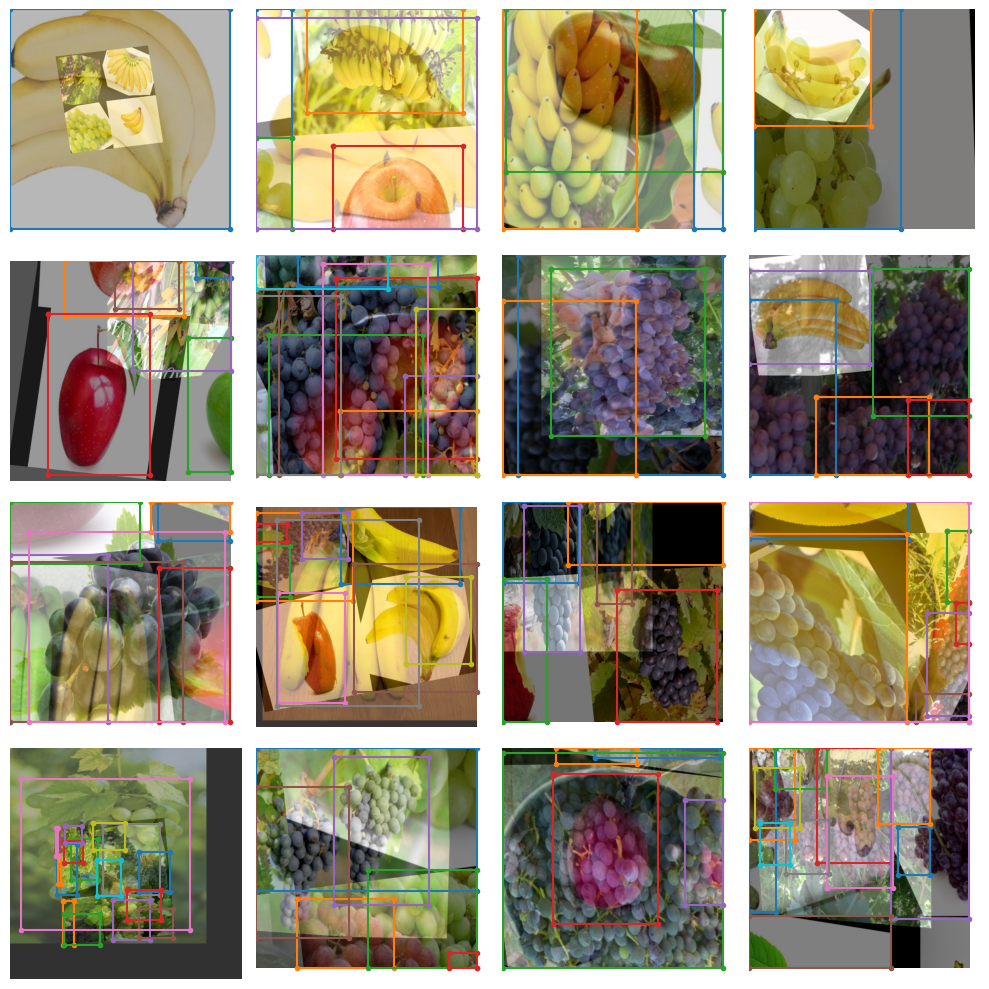

In [7]:
train_data.dataset.plot()

## Step6. Instantiating the model
- You saw how to instantiate the model for inference earlier. 
- Below is how to instantiate the model for finetuning. Note you need to add the `num_classes` argument here.
- Note, for this tutorial we are using `yolo_nas_s`, but SuperGradients has two other flavors of YOLONAS available to you: `yolo_nas_m` and `yolo_nas_l`.

In [12]:
from super_gradients.training import models

In [13]:

import torch
device = 'cuda' if torch.cuda.is_available() else "cpu"
print(device)

model = models.get('yolo_nas_m', 
                   num_classes=len(dataset_params['classes']), 
                   pretrained_weights="coco"
                   )
model = model.to(device)

cuda


[2023-12-06 10:02:16] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2023-12-06 10:02:16] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_m


## Step7. Define metrics and training parameters
We need to define the training parameters for your training run. 

Full details about the training parameters can be found [here](https://github.com/Deci-AI/super-gradients/blob/master/src/super_gradients/recipes/training_hyperparams/default_train_params.yaml).


### There are a few **mandatory** arguments that we must define for training params

- `max_epochs` - Max number of training epochs

- `loss` - the loss function you want to use

- `optimizer` - Optimizer you will be using

- `train_metrics_list` - Metrics to log during training

- `valid_metrics_list` - Metrics to log during training

- `metric_to_watch` - metric which the model checkpoint will be saved according to

We can choose from a variety of `optimizer`'s such as: Adam, AdamW, SGD, Lion, or RMSProps. If you choose to change the defualt parameters of these optimizrs you pass them into `optimizer_params`. 


In [14]:
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050

In [15]:
train_params = {
    "silent_mode": False,   # Silents the Print outs
    "average_best_models":True, # If set, a snapshot dictionary file and the average model will be saved
    "warmup_mode": "LinearEpochLRWarmup", # learning rate warmup scheme, currently ['LinearEpochLRWarmup', 'LinearEpochLRWarmup', 'LinearBatchLRWarmup'] are supported
    "warmup_initial_lr": 1e-6,  # Initial lr for LinearEpochLRWarmup/LinearBatchLRWarmup. When none is given, initial_lr/(warmup_epochs+1) will be used.
    "lr_warmup_epochs": 3,  # number of epochs for learning rate warm up - see https://arxiv.org/pdf/1706.02677.pdf (Section 2.2).
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    # ONLY TRAINING FOR 10 EPOCHS FOR THIS EXAMPLE NOTEBOOK
    "max_epochs": 20,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        # NOTE: num_classes needs to be defined here
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50' # which is mean average precision with IOU of 0.4
}

## Step8. Training the model

You've covered a lot of ground so far:

✅ Instantiated the trainer

✅ Defined your dataset parameters and dataloaders

✅ Instantiated a model

✅ Set up your training parameters

### Now, its time to train a model 

Training a model using a SuperGradients is done using the `trainer`.

It's as easy as...

In [16]:
trainer.train(model=model, 
              training_params=train_params, 
              train_loader=train_data, 
              valid_loader=val_data)

[2023-12-06 10:02:34] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20231206_100234_367044`


[2023-12-06 10:02:34] INFO - sg_trainer.py - Checkpoints directory: Ckpt_fuits_detection_NAS_m\Fuits_detection_NAS_m_V01\RUN_20231206_100234_367044


The console stream is now moved to Ckpt_fuits_detection_NAS_m\Fuits_detection_NAS_m_V01\RUN_20231206_100234_367044/console_Dec06_10_02_34.txt


[2023-12-06 10:02:34] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
[2023-12-06 10:03:39] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            570        (len(train_set))
    - Batch size per GPU:           16         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             16         (num_gpus * batch_size)
    - Effective Batch size:         16         (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         35         (len(train_loader))
    - Gradient updates per epoch:   35         (len(train_loader) / batch_accumulate)
    - Model: YoloNAS_M  (51.13M parameters, 51.13M optimized)
    - Learning Rates and Weight Decays:
      - default: (51.13M parameters). LR: 0.0005 (51.13M parameters) WD: 0.0, (72.21K para

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.0995
│   ├── Ppyoloeloss/loss_iou = 0.7101
│   ├── Ppyoloeloss/loss_dfl = 0.8658
│   └── Ppyoloeloss/loss = 3.6754
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.3228
    ├── Ppyoloeloss/loss_iou = 0.6096
    ├── Ppyoloeloss/loss_dfl = 0.8375
    ├── Ppyoloeloss/loss = 3.7698
    ├── Precision@0.50 = 0.0
    ├── Recall@0.50 = 0.0
    ├── Map@0.50 = 0.0136
    └── F1@0.50 = 0.0



Validating epoch 1: 100%|██████████| 2/2 [00:17<00:00,  8.71s/it]
[2023-12-06 10:09:25] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection_NAS_m\Fuits_detection_NAS_m_V01\RUN_20231206_100234_367044\ckpt_best.pth
[2023-12-06 10:09:25] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.17624437808990479


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.4384
│   │   ├── Epoch N-1      = 2.0995 (↘ -0.6611)
│   │   └── Best until now = 2.0995 (↘ -0.6611)
│   ├── Ppyoloeloss/loss_iou = 0.5769
│   │   ├── Epoch N-1      = 0.7101 (↘ -0.1332)
│   │   └── Best until now = 0.7101 (↘ -0.1332)
│   ├── Ppyoloeloss/loss_dfl = 0.802
│   │   ├── Epoch N-1      = 0.8658 (↘ -0.0638)
│   │   └── Best until now = 0.8658 (↘ -0.0638)
│   └── Ppyoloeloss/loss = 2.8173
│       ├── Epoch N-1      = 3.6754 (↘ -0.8581)
│       └── Best until now = 3.6754 (↘ -0.8581)
└── Validation
    ├── Ppyoloeloss/loss_cls = 4.2
    │   ├── Epoch N-1      = 2.3228 (↗ 1.8772)
    │   └── Best until now = 2.3228 (↗ 1.8772)
    ├── Ppyoloeloss/loss_iou = 0.7524
    │   ├── Epoch N-1      = 0.6096 (↗ 0.1429)
    │   └── Best until now = 0.6096 (↗ 0.1429)
    ├── Ppyoloeloss/loss_dfl = 1.008
    │   ├── Epoch N-1      = 0.8375 (↗ 0.1706)
    │   └── Best until now = 0.8375 (↗ 0.1706)
    ├── Ppyoloeloss/loss = 5.9605

Validating epoch 2: 100%|██████████| 2/2 [00:16<00:00,  8.49s/it]
[2023-12-06 10:12:32] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection_NAS_m\Fuits_detection_NAS_m_V01\RUN_20231206_100234_367044\ckpt_best.pth
[2023-12-06 10:12:32] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.296712189912796


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2252
│   │   ├── Epoch N-1      = 1.4384 (↘ -0.2132)
│   │   └── Best until now = 1.4384 (↘ -0.2132)
│   ├── Ppyoloeloss/loss_iou = 0.568
│   │   ├── Epoch N-1      = 0.5769 (↘ -0.0089)
│   │   └── Best until now = 0.5769 (↘ -0.0089)
│   ├── Ppyoloeloss/loss_dfl = 0.7891
│   │   ├── Epoch N-1      = 0.802  (↘ -0.0129)
│   │   └── Best until now = 0.802  (↘ -0.0129)
│   └── Ppyoloeloss/loss = 2.5823
│       ├── Epoch N-1      = 2.8173 (↘ -0.235)
│       └── Best until now = 2.8173 (↘ -0.235)
└── Validation
    ├── Ppyoloeloss/loss_cls = 5.5645
    │   ├── Epoch N-1      = 4.2    (↗ 1.3645)
    │   └── Best until now = 2.3228 (↗ 3.2417)
    ├── Ppyoloeloss/loss_iou = 0.6393
    │   ├── Epoch N-1      = 0.7524 (↘ -0.1131)
    │   └── Best until now = 0.6096 (↗ 0.0297)
    ├── Ppyoloeloss/loss_dfl = 0.9232
    │   ├── Epoch N-1      = 1.008  (↘ -0.0848)
    │   └── Best until now = 0.8375 (↗ 0.0857)
    ├── Ppyoloeloss/loss = 7.

Validating epoch 3: 100%|██████████| 2/2 [00:17<00:00,  8.83s/it]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2271
│   │   ├── Epoch N-1      = 1.2252 (↗ 0.0019)
│   │   └── Best until now = 1.2252 (↗ 0.0019)
│   ├── Ppyoloeloss/loss_iou = 0.5524
│   │   ├── Epoch N-1      = 0.568  (↘ -0.0156)
│   │   └── Best until now = 0.568  (↘ -0.0156)
│   ├── Ppyoloeloss/loss_dfl = 0.7748
│   │   ├── Epoch N-1      = 0.7891 (↘ -0.0143)
│   │   └── Best until now = 0.7891 (↘ -0.0143)
│   └── Ppyoloeloss/loss = 2.5544
│       ├── Epoch N-1      = 2.5823 (↘ -0.028)
│       └── Best until now = 2.5823 (↘ -0.028)
└── Validation
    ├── Ppyoloeloss/loss_cls = 3.798
    │   ├── Epoch N-1      = 5.5645 (↘ -1.7664)
    │   └── Best until now = 2.3228 (↗ 1.4753)
    ├── Ppyoloeloss/loss_iou = 0.602
    │   ├── Epoch N-1      = 0.6393 (↘ -0.0373)
    │   └── Best until now = 0.6096 (↘ -0.0076)
    ├── Ppyoloeloss/loss_dfl = 0.9341
    │   ├── Epoch N-1      = 0.9232 (↗ 0.0109)
    │   └── Best until now = 0.8375 (↗ 0.0966)
    ├── Ppyoloeloss/loss = 5.33

Validating epoch 4: 100%|██████████| 2/2 [00:17<00:00,  8.64s/it]
[2023-12-06 10:18:39] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection_NAS_m\Fuits_detection_NAS_m_V01\RUN_20231206_100234_367044\ckpt_best.pth
[2023-12-06 10:18:39] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.435872346162796


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2205
│   │   ├── Epoch N-1      = 1.2271 (↘ -0.0067)
│   │   └── Best until now = 1.2252 (↘ -0.0048)
│   ├── Ppyoloeloss/loss_iou = 0.541
│   │   ├── Epoch N-1      = 0.5524 (↘ -0.0114)
│   │   └── Best until now = 0.5524 (↘ -0.0114)
│   ├── Ppyoloeloss/loss_dfl = 0.768
│   │   ├── Epoch N-1      = 0.7748 (↘ -0.0068)
│   │   └── Best until now = 0.7748 (↘ -0.0068)
│   └── Ppyoloeloss/loss = 2.5294
│       ├── Epoch N-1      = 2.5544 (↘ -0.025)
│       └── Best until now = 2.5544 (↘ -0.025)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.8921
    │   ├── Epoch N-1      = 3.798  (↘ -0.9059)
    │   └── Best until now = 2.3228 (↗ 0.5693)
    ├── Ppyoloeloss/loss_iou = 0.6049
    │   ├── Epoch N-1      = 0.602  (↗ 0.0029)
    │   └── Best until now = 0.602  (↗ 0.0029)
    ├── Ppyoloeloss/loss_dfl = 0.8852
    │   ├── Epoch N-1      = 0.9341 (↘ -0.0488)
    │   └── Best until now = 0.8375 (↗ 0.0478)
    ├── Ppyoloeloss/loss = 4.3

Validating epoch 5: 100%|██████████| 2/2 [00:17<00:00,  8.65s/it]
[2023-12-06 10:22:06] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection_NAS_m\Fuits_detection_NAS_m_V01\RUN_20231206_100234_367044\ckpt_best.pth
[2023-12-06 10:22:06] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.44432270526885986


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2138
│   │   ├── Epoch N-1      = 1.2205 (↘ -0.0067)
│   │   └── Best until now = 1.2205 (↘ -0.0067)
│   ├── Ppyoloeloss/loss_iou = 0.5169
│   │   ├── Epoch N-1      = 0.541  (↘ -0.024)
│   │   └── Best until now = 0.541  (↘ -0.024)
│   ├── Ppyoloeloss/loss_dfl = 0.7445
│   │   ├── Epoch N-1      = 0.768  (↘ -0.0235)
│   │   └── Best until now = 0.768  (↘ -0.0235)
│   └── Ppyoloeloss/loss = 2.4752
│       ├── Epoch N-1      = 2.5294 (↘ -0.0542)
│       └── Best until now = 2.5294 (↘ -0.0542)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.9641
    │   ├── Epoch N-1      = 2.8921 (↘ -0.928)
    │   └── Best until now = 2.3228 (↘ -0.3587)
    ├── Ppyoloeloss/loss_iou = 0.573
    │   ├── Epoch N-1      = 0.6049 (↘ -0.032)
    │   └── Best until now = 0.602  (↘ -0.029)
    ├── Ppyoloeloss/loss_dfl = 0.823
    │   ├── Epoch N-1      = 0.8852 (↘ -0.0622)
    │   └── Best until now = 0.8375 (↘ -0.0145)
    ├── Ppyoloeloss/loss = 3.

Validating epoch 6: 100%|██████████| 2/2 [00:17<00:00,  8.97s/it]
[2023-12-06 10:25:46] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection_NAS_m\Fuits_detection_NAS_m_V01\RUN_20231206_100234_367044\ckpt_best.pth
[2023-12-06 10:25:46] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.46205759048461914


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1785
│   │   ├── Epoch N-1      = 1.2138 (↘ -0.0353)
│   │   └── Best until now = 1.2138 (↘ -0.0353)
│   ├── Ppyoloeloss/loss_iou = 0.5011
│   │   ├── Epoch N-1      = 0.5169 (↘ -0.0158)
│   │   └── Best until now = 0.5169 (↘ -0.0158)
│   ├── Ppyoloeloss/loss_dfl = 0.7282
│   │   ├── Epoch N-1      = 0.7445 (↘ -0.0163)
│   │   └── Best until now = 0.7445 (↘ -0.0163)
│   └── Ppyoloeloss/loss = 2.4078
│       ├── Epoch N-1      = 2.4752 (↘ -0.0675)
│       └── Best until now = 2.4752 (↘ -0.0675)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3651
    │   ├── Epoch N-1      = 1.9641 (↘ -0.599)
    │   └── Best until now = 1.9641 (↘ -0.599)
    ├── Ppyoloeloss/loss_iou = 0.5717
    │   ├── Epoch N-1      = 0.573  (↘ -0.0013)
    │   └── Best until now = 0.573  (↘ -0.0013)
    ├── Ppyoloeloss/loss_dfl = 0.8281
    │   ├── Epoch N-1      = 0.823  (↗ 0.0051)
    │   └── Best until now = 0.823  (↗ 0.0051)
    ├── Ppyoloeloss/loss =

Validating epoch 7: 100%|██████████| 2/2 [00:17<00:00,  8.92s/it]
[2023-12-06 10:29:26] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection_NAS_m\Fuits_detection_NAS_m_V01\RUN_20231206_100234_367044\ckpt_best.pth
[2023-12-06 10:29:26] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.52264803647995


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1787
│   │   ├── Epoch N-1      = 1.1785 (↗ 0.0002)
│   │   └── Best until now = 1.1785 (↗ 0.0002)
│   ├── Ppyoloeloss/loss_iou = 0.4958
│   │   ├── Epoch N-1      = 0.5011 (↘ -0.0053)
│   │   └── Best until now = 0.5011 (↘ -0.0053)
│   ├── Ppyoloeloss/loss_dfl = 0.7263
│   │   ├── Epoch N-1      = 0.7282 (↘ -0.0019)
│   │   └── Best until now = 0.7282 (↘ -0.0019)
│   └── Ppyoloeloss/loss = 2.4008
│       ├── Epoch N-1      = 2.4078 (↘ -0.007)
│       └── Best until now = 2.4078 (↘ -0.007)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2473
    │   ├── Epoch N-1      = 1.3651 (↘ -0.1178)
    │   └── Best until now = 1.3651 (↘ -0.1178)
    ├── Ppyoloeloss/loss_iou = 0.555
    │   ├── Epoch N-1      = 0.5717 (↘ -0.0167)
    │   └── Best until now = 0.5717 (↘ -0.0167)
    ├── Ppyoloeloss/loss_dfl = 0.7915
    │   ├── Epoch N-1      = 0.8281 (↘ -0.0366)
    │   └── Best until now = 0.823  (↘ -0.0315)
    ├── Ppyoloeloss/loss = 

Validating epoch 8: 100%|██████████| 2/2 [00:17<00:00,  8.53s/it]


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1519
│   │   ├── Epoch N-1      = 1.1787 (↘ -0.0267)
│   │   └── Best until now = 1.1785 (↘ -0.0265)
│   ├── Ppyoloeloss/loss_iou = 0.4845
│   │   ├── Epoch N-1      = 0.4958 (↘ -0.0113)
│   │   └── Best until now = 0.4958 (↘ -0.0113)
│   ├── Ppyoloeloss/loss_dfl = 0.7107
│   │   ├── Epoch N-1      = 0.7263 (↘ -0.0156)
│   │   └── Best until now = 0.7263 (↘ -0.0156)
│   └── Ppyoloeloss/loss = 2.3471
│       ├── Epoch N-1      = 2.4008 (↘ -0.0536)
│       └── Best until now = 2.4008 (↘ -0.0536)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1859
    │   ├── Epoch N-1      = 1.2473 (↘ -0.0615)
    │   └── Best until now = 1.2473 (↘ -0.0615)
    ├── Ppyoloeloss/loss_iou = 0.6083
    │   ├── Epoch N-1      = 0.555  (↗ 0.0533)
    │   └── Best until now = 0.555  (↗ 0.0533)
    ├── Ppyoloeloss/loss_dfl = 0.8402
    │   ├── Epoch N-1      = 0.7915 (↗ 0.0487)
    │   └── Best until now = 0.7915 (↗ 0.0487)
    ├── Ppyoloeloss/loss =

Validating epoch 9: 100%|██████████| 2/2 [00:17<00:00,  8.77s/it]


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1637
│   │   ├── Epoch N-1      = 1.1519 (↗ 0.0117)
│   │   └── Best until now = 1.1519 (↗ 0.0117)
│   ├── Ppyoloeloss/loss_iou = 0.4832
│   │   ├── Epoch N-1      = 0.4845 (↘ -0.0013)
│   │   └── Best until now = 0.4845 (↘ -0.0013)
│   ├── Ppyoloeloss/loss_dfl = 0.7153
│   │   ├── Epoch N-1      = 0.7107 (↗ 0.0046)
│   │   └── Best until now = 0.7107 (↗ 0.0046)
│   └── Ppyoloeloss/loss = 2.3622
│       ├── Epoch N-1      = 2.3471 (↗ 0.0151)
│       └── Best until now = 2.3471 (↗ 0.0151)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3398
    │   ├── Epoch N-1      = 1.1859 (↗ 0.1539)
    │   └── Best until now = 1.1859 (↗ 0.1539)
    ├── Ppyoloeloss/loss_iou = 0.5629
    │   ├── Epoch N-1      = 0.6083 (↘ -0.0454)
    │   └── Best until now = 0.555  (↗ 0.0079)
    ├── Ppyoloeloss/loss_dfl = 0.7854
    │   ├── Epoch N-1      = 0.8402 (↘ -0.0548)
    │   └── Best until now = 0.7915 (↘ -0.0061)
    ├── Ppyoloeloss/loss = 2.68

Validating epoch 10: 100%|██████████| 2/2 [00:17<00:00,  8.75s/it]
[2023-12-06 10:40:21] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection_NAS_m\Fuits_detection_NAS_m_V01\RUN_20231206_100234_367044\ckpt_best.pth
[2023-12-06 10:40:21] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5709509253501892


SUMMARY OF EPOCH 10
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1293
│   │   ├── Epoch N-1      = 1.1637 (↘ -0.0344)
│   │   └── Best until now = 1.1519 (↘ -0.0226)
│   ├── Ppyoloeloss/loss_iou = 0.4611
│   │   ├── Epoch N-1      = 0.4832 (↘ -0.0221)
│   │   └── Best until now = 0.4832 (↘ -0.0221)
│   ├── Ppyoloeloss/loss_dfl = 0.6904
│   │   ├── Epoch N-1      = 0.7153 (↘ -0.025)
│   │   └── Best until now = 0.7107 (↘ -0.0203)
│   └── Ppyoloeloss/loss = 2.2808
│       ├── Epoch N-1      = 2.3622 (↘ -0.0814)
│       └── Best until now = 2.3471 (↘ -0.0664)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.247
    │   ├── Epoch N-1      = 1.3398 (↘ -0.0928)
    │   └── Best until now = 1.1859 (↗ 0.0611)
    ├── Ppyoloeloss/loss_iou = 0.5823
    │   ├── Epoch N-1      = 0.5629 (↗ 0.0194)
    │   └── Best until now = 0.555  (↗ 0.0273)
    ├── Ppyoloeloss/loss_dfl = 0.8326
    │   ├── Epoch N-1      = 0.7854 (↗ 0.0472)
    │   └── Best until now = 0.7854 (↗ 0.0472)
    ├── Ppyoloeloss/loss = 2

Validating epoch 11: 100%|██████████| 2/2 [00:16<00:00,  8.23s/it]


SUMMARY OF EPOCH 11
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1136
│   │   ├── Epoch N-1      = 1.1293 (↘ -0.0157)
│   │   └── Best until now = 1.1293 (↘ -0.0157)
│   ├── Ppyoloeloss/loss_iou = 0.4615
│   │   ├── Epoch N-1      = 0.4611 (↗ 0.0004)
│   │   └── Best until now = 0.4611 (↗ 0.0004)
│   ├── Ppyoloeloss/loss_dfl = 0.6947
│   │   ├── Epoch N-1      = 0.6904 (↗ 0.0043)
│   │   └── Best until now = 0.6904 (↗ 0.0043)
│   └── Ppyoloeloss/loss = 2.2699
│       ├── Epoch N-1      = 2.2808 (↘ -0.0109)
│       └── Best until now = 2.2808 (↘ -0.0109)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1767
    │   ├── Epoch N-1      = 1.247  (↘ -0.0703)
    │   └── Best until now = 1.1859 (↘ -0.0092)
    ├── Ppyoloeloss/loss_iou = 0.5743
    │   ├── Epoch N-1      = 0.5823 (↘ -0.008)
    │   └── Best until now = 0.555  (↗ 0.0193)
    ├── Ppyoloeloss/loss_dfl = 0.8088
    │   ├── Epoch N-1      = 0.8326 (↘ -0.0238)
    │   └── Best until now = 0.7854 (↗ 0.0235)
    ├── Ppyoloeloss/loss = 2

Validating epoch 12: 100%|██████████| 2/2 [00:16<00:00,  8.13s/it]
[2023-12-06 10:47:51] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection_NAS_m\Fuits_detection_NAS_m_V01\RUN_20231206_100234_367044\ckpt_best.pth
[2023-12-06 10:47:51] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5863828063011169


SUMMARY OF EPOCH 12
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0921
│   │   ├── Epoch N-1      = 1.1136 (↘ -0.0215)
│   │   └── Best until now = 1.1136 (↘ -0.0215)
│   ├── Ppyoloeloss/loss_iou = 0.4542
│   │   ├── Epoch N-1      = 0.4615 (↘ -0.0073)
│   │   └── Best until now = 0.4611 (↘ -0.0069)
│   ├── Ppyoloeloss/loss_dfl = 0.6803
│   │   ├── Epoch N-1      = 0.6947 (↘ -0.0144)
│   │   └── Best until now = 0.6904 (↘ -0.0101)
│   └── Ppyoloeloss/loss = 2.2266
│       ├── Epoch N-1      = 2.2699 (↘ -0.0433)
│       └── Best until now = 2.2699 (↘ -0.0433)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1491
    │   ├── Epoch N-1      = 1.1767 (↘ -0.0276)
    │   └── Best until now = 1.1767 (↘ -0.0276)
    ├── Ppyoloeloss/loss_iou = 0.5283
    │   ├── Epoch N-1      = 0.5743 (↘ -0.0461)
    │   └── Best until now = 0.555  (↘ -0.0267)
    ├── Ppyoloeloss/loss_dfl = 0.7401
    │   ├── Epoch N-1      = 0.8088 (↘ -0.0687)
    │   └── Best until now = 0.7854 (↘ -0.0452)
    ├── Ppyoloeloss/l

Validating epoch 13: 100%|██████████| 2/2 [00:16<00:00,  8.21s/it]
[2023-12-06 10:51:53] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection_NAS_m\Fuits_detection_NAS_m_V01\RUN_20231206_100234_367044\ckpt_best.pth
[2023-12-06 10:51:53] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6459174156188965


SUMMARY OF EPOCH 13
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0881
│   │   ├── Epoch N-1      = 1.0921 (↘ -0.004)
│   │   └── Best until now = 1.0921 (↘ -0.004)
│   ├── Ppyoloeloss/loss_iou = 0.4548
│   │   ├── Epoch N-1      = 0.4542 (↗ 0.0007)
│   │   └── Best until now = 0.4542 (↗ 0.0007)
│   ├── Ppyoloeloss/loss_dfl = 0.6779
│   │   ├── Epoch N-1      = 0.6803 (↘ -0.0024)
│   │   └── Best until now = 0.6803 (↘ -0.0024)
│   └── Ppyoloeloss/loss = 2.2208
│       ├── Epoch N-1      = 2.2266 (↘ -0.0058)
│       └── Best until now = 2.2266 (↘ -0.0058)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0581
    │   ├── Epoch N-1      = 1.1491 (↘ -0.091)
    │   └── Best until now = 1.1491 (↘ -0.091)
    ├── Ppyoloeloss/loss_iou = 0.4994
    │   ├── Epoch N-1      = 0.5283 (↘ -0.0288)
    │   └── Best until now = 0.5283 (↘ -0.0288)
    ├── Ppyoloeloss/loss_dfl = 0.7168
    │   ├── Epoch N-1      = 0.7401 (↘ -0.0234)
    │   └── Best until now = 0.7401 (↘ -0.0234)
    ├── Ppyoloeloss/loss = 

Validating epoch 14: 100%|██████████| 2/2 [00:16<00:00,  8.27s/it]


SUMMARY OF EPOCH 14
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0569
│   │   ├── Epoch N-1      = 1.0881 (↘ -0.0311)
│   │   └── Best until now = 1.0881 (↘ -0.0311)
│   ├── Ppyoloeloss/loss_iou = 0.4375
│   │   ├── Epoch N-1      = 0.4548 (↘ -0.0173)
│   │   └── Best until now = 0.4542 (↘ -0.0167)
│   ├── Ppyoloeloss/loss_dfl = 0.6604
│   │   ├── Epoch N-1      = 0.6779 (↘ -0.0175)
│   │   └── Best until now = 0.6779 (↘ -0.0175)
│   └── Ppyoloeloss/loss = 2.1548
│       ├── Epoch N-1      = 2.2208 (↘ -0.0659)
│       └── Best until now = 2.2208 (↘ -0.0659)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1092
    │   ├── Epoch N-1      = 1.0581 (↗ 0.0511)
    │   └── Best until now = 1.0581 (↗ 0.0511)
    ├── Ppyoloeloss/loss_iou = 0.5324
    │   ├── Epoch N-1      = 0.4994 (↗ 0.033)
    │   └── Best until now = 0.4994 (↗ 0.033)
    ├── Ppyoloeloss/loss_dfl = 0.7608
    │   ├── Epoch N-1      = 0.7168 (↗ 0.044)
    │   └── Best until now = 0.7168 (↗ 0.044)
    ├── Ppyoloeloss/loss = 2.40

Validating epoch 15: 100%|██████████| 2/2 [00:16<00:00,  8.39s/it]


SUMMARY OF EPOCH 15
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0467
│   │   ├── Epoch N-1      = 1.0569 (↘ -0.0102)
│   │   └── Best until now = 1.0569 (↘ -0.0102)
│   ├── Ppyoloeloss/loss_iou = 0.4272
│   │   ├── Epoch N-1      = 0.4375 (↘ -0.0103)
│   │   └── Best until now = 0.4375 (↘ -0.0103)
│   ├── Ppyoloeloss/loss_dfl = 0.6556
│   │   ├── Epoch N-1      = 0.6604 (↘ -0.0048)
│   │   └── Best until now = 0.6604 (↘ -0.0048)
│   └── Ppyoloeloss/loss = 2.1295
│       ├── Epoch N-1      = 2.1548 (↘ -0.0254)
│       └── Best until now = 2.1548 (↘ -0.0254)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.087
    │   ├── Epoch N-1      = 1.1092 (↘ -0.0222)
    │   └── Best until now = 1.0581 (↗ 0.0289)
    ├── Ppyoloeloss/loss_iou = 0.5352
    │   ├── Epoch N-1      = 0.5324 (↗ 0.0028)
    │   └── Best until now = 0.4994 (↗ 0.0357)
    ├── Ppyoloeloss/loss_dfl = 0.7452
    │   ├── Epoch N-1      = 0.7608 (↘ -0.0155)
    │   └── Best until now = 0.7168 (↗ 0.0285)
    ├── Ppyoloeloss/loss =

Validating epoch 16: 100%|██████████| 2/2 [00:17<00:00,  8.76s/it]


SUMMARY OF EPOCH 16
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0536
│   │   ├── Epoch N-1      = 1.0467 (↗ 0.0069)
│   │   └── Best until now = 1.0467 (↗ 0.0069)
│   ├── Ppyoloeloss/loss_iou = 0.425
│   │   ├── Epoch N-1      = 0.4272 (↘ -0.0021)
│   │   └── Best until now = 0.4272 (↘ -0.0021)
│   ├── Ppyoloeloss/loss_dfl = 0.6591
│   │   ├── Epoch N-1      = 0.6556 (↗ 0.0035)
│   │   └── Best until now = 0.6556 (↗ 0.0035)
│   └── Ppyoloeloss/loss = 2.1378
│       ├── Epoch N-1      = 2.1295 (↗ 0.0083)
│       └── Best until now = 2.1295 (↗ 0.0083)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0275
    │   ├── Epoch N-1      = 1.087  (↘ -0.0594)
    │   └── Best until now = 1.0581 (↘ -0.0306)
    ├── Ppyoloeloss/loss_iou = 0.5022
    │   ├── Epoch N-1      = 0.5352 (↘ -0.0329)
    │   └── Best until now = 0.4994 (↗ 0.0028)
    ├── Ppyoloeloss/loss_dfl = 0.7142
    │   ├── Epoch N-1      = 0.7452 (↘ -0.0311)
    │   └── Best until now = 0.7168 (↘ -0.0026)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 17: 100%|██████████| 2/2 [00:16<00:00,  8.22s/it]


SUMMARY OF EPOCH 17
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0272
│   │   ├── Epoch N-1      = 1.0536 (↘ -0.0265)
│   │   └── Best until now = 1.0467 (↘ -0.0195)
│   ├── Ppyoloeloss/loss_iou = 0.4272
│   │   ├── Epoch N-1      = 0.425  (↗ 0.0022)
│   │   └── Best until now = 0.425  (↗ 0.0022)
│   ├── Ppyoloeloss/loss_dfl = 0.6606
│   │   ├── Epoch N-1      = 0.6591 (↗ 0.0015)
│   │   └── Best until now = 0.6556 (↗ 0.005)
│   └── Ppyoloeloss/loss = 2.115
│       ├── Epoch N-1      = 2.1378 (↘ -0.0227)
│       └── Best until now = 2.1295 (↘ -0.0144)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0452
    │   ├── Epoch N-1      = 1.0275 (↗ 0.0176)
    │   └── Best until now = 1.0275 (↗ 0.0176)
    ├── Ppyoloeloss/loss_iou = 0.4931
    │   ├── Epoch N-1      = 0.5022 (↘ -0.0092)
    │   └── Best until now = 0.4994 (↘ -0.0064)
    ├── Ppyoloeloss/loss_dfl = 0.706
    │   ├── Epoch N-1      = 0.7142 (↘ -0.0082)
    │   └── Best until now = 0.7142 (↘ -0.0082)
    ├── Ppyoloeloss/loss = 2.2

Validating epoch 18: 100%|██████████| 2/2 [00:16<00:00,  8.37s/it]


SUMMARY OF EPOCH 18
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0234
│   │   ├── Epoch N-1      = 1.0272 (↘ -0.0038)
│   │   └── Best until now = 1.0272 (↘ -0.0038)
│   ├── Ppyoloeloss/loss_iou = 0.4271
│   │   ├── Epoch N-1      = 0.4272 (↘ -0.0002)
│   │   └── Best until now = 0.425  (↗ 0.002)
│   ├── Ppyoloeloss/loss_dfl = 0.6492
│   │   ├── Epoch N-1      = 0.6606 (↘ -0.0114)
│   │   └── Best until now = 0.6556 (↘ -0.0064)
│   └── Ppyoloeloss/loss = 2.0997
│       ├── Epoch N-1      = 2.115  (↘ -0.0154)
│       └── Best until now = 2.115  (↘ -0.0154)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0727
    │   ├── Epoch N-1      = 1.0452 (↗ 0.0275)
    │   └── Best until now = 1.0275 (↗ 0.0451)
    ├── Ppyoloeloss/loss_iou = 0.4736
    │   ├── Epoch N-1      = 0.4931 (↘ -0.0194)
    │   └── Best until now = 0.4931 (↘ -0.0194)
    ├── Ppyoloeloss/loss_dfl = 0.6835
    │   ├── Epoch N-1      = 0.706  (↘ -0.0225)
    │   └── Best until now = 0.706  (↘ -0.0225)
    ├── Ppyoloeloss/loss 

Validating epoch 19: 100%|██████████| 2/2 [00:16<00:00,  8.31s/it]
[2023-12-06 11:13:52] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection_NAS_m\Fuits_detection_NAS_m_V01\RUN_20231206_100234_367044\ckpt_best.pth
[2023-12-06 11:13:52] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.672372043132782


SUMMARY OF EPOCH 19
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.994
│   │   ├── Epoch N-1      = 1.0234 (↘ -0.0293)
│   │   └── Best until now = 1.0234 (↘ -0.0293)
│   ├── Ppyoloeloss/loss_iou = 0.4158
│   │   ├── Epoch N-1      = 0.4271 (↘ -0.0113)
│   │   └── Best until now = 0.425  (↘ -0.0092)
│   ├── Ppyoloeloss/loss_dfl = 0.6303
│   │   ├── Epoch N-1      = 0.6492 (↘ -0.019)
│   │   └── Best until now = 0.6492 (↘ -0.019)
│   └── Ppyoloeloss/loss = 2.0401
│       ├── Epoch N-1      = 2.0997 (↘ -0.0596)
│       └── Best until now = 2.0997 (↘ -0.0596)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0077
    │   ├── Epoch N-1      = 1.0727 (↘ -0.065)
    │   └── Best until now = 1.0275 (↘ -0.0198)
    ├── Ppyoloeloss/loss_iou = 0.4777
    │   ├── Epoch N-1      = 0.4736 (↗ 0.0041)
    │   └── Best until now = 0.4736 (↗ 0.0041)
    ├── Ppyoloeloss/loss_dfl = 0.6866
    │   ├── Epoch N-1      = 0.6835 (↗ 0.0031)
    │   └── Best until now = 0.6835 (↗ 0.0031)
    ├── Ppyoloeloss/loss = 2.

[2023-12-06 11:15:15] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 20: 100%|██████████| 2/2 [00:15<00:00,  6.62s/it]

Validating epoch 20: 100%|██████████| 2/2 [00:17<00:00,  8.53s/it]
[2023-12-06 11:15:34] INFO - base_sg_logger.py - [CLEANUP] - Successfully stopped system monitoring process


## Step9. Best 모델 가져오기

In [17]:
%cd {HOME}

f:\00_Study\00_Project_and_Practice\005_AI_P__YOLO-NAS_Fruit_Detection\YOLO-NAS_Fruits_detection_using_custom_dataset


In [18]:
import torch
device = 'cuda' if torch.cuda.is_available() else "cpu"
print(device)

best_model = models.get('yolo_nas_m',
                        num_classes=len(dataset_params['classes']),
                        checkpoint_path=f"{HOME}/Ckpt_fuits_detection_NAS_m/Fuits_detection_NAS_m_V01/RUN_20231206_100234_367044/ckpt_best.pth")

best_model = best_model.to(device)

cuda


[2023-12-06 12:14:03] INFO - checkpoint_utils.py - Successfully loaded model weights from f:\00_Study\00_Project_and_Practice\005_AI_P__YOLO-NAS_Fruit_Detection\YOLO-NAS_Fruits_detection_using_custom_dataset/Ckpt_fuits_detection_NAS_m/Fuits_detection_NAS_m_V01/RUN_20231206_100234_367044/ckpt_best.pth EMA checkpoint.


## Step10. Model 평가

In [19]:
trainer.test(model=best_model,
            test_loader=test_data,
            test_metrics_list=DetectionMetrics_050(score_thres=0.1, 
                                                   top_k_predictions=300, 
                                                   num_cls=len(dataset_params['classes']), 
                                                   normalize_targets=True, 
                                                   post_prediction_callback=PPYoloEPostPredictionCallback(score_threshold=0.01, 
                                                                                                          nms_top_k=1000, 
                                                                                                          max_predictions=300,                                                                              
                                                                                                          nms_threshold=0.7)
                                                  ))

Testing: 100%|██████████| 1/1 [00:15<00:00, 15.84s/it]

{'PPYoloELoss/loss_cls': 0.91333544,
 'PPYoloELoss/loss_iou': 0.3362406,
 'PPYoloELoss/loss_dfl': 0.6536014,
 'PPYoloELoss/loss': 1.9031774,
 'Precision@0.50': 0.022151833400130272,
 'Recall@0.50': 1.0,
 'mAP@0.50': 0.855844259262085,
 'F1@0.50': 0.04331067577004433}

Testing: 100%|██████████| 1/1 [00:16<00:00, 16.96s/it]


## Step11. 예상하기

[2023-12-06 12:15:29] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


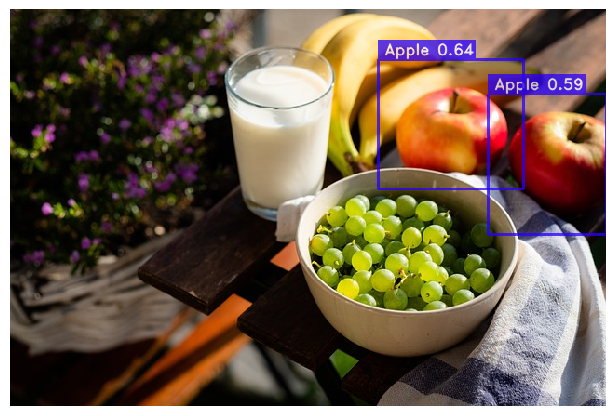

In [20]:
# 이미지 Test
img_url = f'{HOME}/healthy-5506822_640.jpg'
best_model.predict(img_url).show()

In [21]:
# 영상 Test
!del {HOME}\autumn_-_27932_540p_detection.mp4

input_video=f'{HOME}/autumn_-_27932_540p.mp4'
output_video=f'{HOME}/autumn_-_27932_540p_NAS_m_detection.mp4'

best_model.predict(input_video, conf=0.45).save(output_video)

Processing Video: 100%|██████████| 399/399 [00:17<00:00, 22.94it/s]


In [22]:
from IPython.display import HTML
from base64 import b64encode

!del {HOME}\autumn_-_27932_540p_NAS_m_detection_compressed.mp4

# Input video path
input_path = f'{HOME}/autumn_-_27932_540p_NAS_m_detection.mp4'

# Compressed video path
compressed_path = f"{HOME}/autumn_-_27932_540p_NAS_m_detection_compressed.mp4"

os.system(f"ffmpeg -i {input_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=900 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

Could Not Find f:\00_Study\00_Project_and_Practice\005_AI_P__YOLO-NAS_Fruit_Detection\YOLO-NAS_Fruits_detection_using_custom_dataset\autumn_-_27932_540p_NAS_m_detection_compressed.mp4


In [8]:
#import cv2
best_model.predict_webcam(conf=0.45)

[2023-12-05 18:34:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


KeyboardInterrupt: 

: 